In [119]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

In [120]:
def get_gradient(img, threshold):
    grad_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
    grad_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)

    gradient = np.sqrt(grad_x**2 + grad_y**2)
    gradient[gradient < threshold] = 0

    direction = np.arctan2(grad_y, grad_x) * 180 / np.pi
    direction[direction < -15] += 180

    return gradient, direction


In [121]:
def cellgrid(img, tao):
    m, n = img.shape[0] // tao, img.shape[1] // tao
    return m, n

def hog(img, thres, tao):
    m, n = cellgrid(img, tao)
    gradient, direction = get_gradient(img, thres)

    magnitude_hist = np.zeros((m, n, 6))
    occurence_hist = np.zeros((m, n, 6))

    bins = np.array([-15, 15, 45, 75, 105, 135, 165])

    bin_indices = np.digitize(direction, bins) - 1
    bin_indices[bin_indices == 6] = 0

    for i in range(m * tao):
        for j in range(n * tao):
            i_index = i // tao
            j_index = j // tao
            bin_index = bin_indices[i, j]
            magnitude_hist[i_index, j_index, bin_index] += gradient[i, j]
            occurence_hist[i_index, j_index, bin_index] += 1

    return magnitude_hist, occurence_hist

In [122]:
def plot_hist(img, approach, tao):
    m,n = cellgrid(img, tao)

    img = img.astype('float') / 255.0
    if tao > 15:
        plt.figure(figsize=(15, 15))
    plt.imshow(img, cmap='gray', vmin=0, vmax=1)

    x_grid = np.r_[int(tao / 2) : tao * n - 1: tao]
    y_grid = np.r_[int(tao / 2) : tao * m - 1: tao]

    meshX, meshY = np.meshgrid(x_grid, y_grid)
    for i in range(6):
        plt.quiver(meshX, meshY, np.sin(i * np.pi/6)*approach[:,:,i], np.cos(i * np.pi/6)*approach[:,:,i],  pivot='middle',color="red")
    plt.show()

In [123]:
def write_txt(file_path, descriptor):
    m, n, p = descriptor.shape
    with open(file_path, "w") as f:
        for i in range(m):
            for j in range(n):
                row_data = "  ".join(map(str, descriptor[i, j, :]))
                f.write(row_data + "\n")

In [124]:
def adjust_norm_size(hist):
    hist1, hist2, hist3, hist4 = hist[:, :, :6], hist[:, :, 6:12], hist[:, :, 12:18], hist[:, :, 18:]

    result = np.zeros((hist.shape[0] + 1, hist.shape[1] + 1, 6))
    result[1:, 1:, :] = np.mean([hist1[:, :, :], hist2[:, :, :], hist3[:, :, :], hist4[:, :, :]], axis=0)
    result[0, 1:, :] = np.mean([hist1[0, :, :], hist2[0, :, :]], axis=0)
    result[1:, 0, :] = np.mean([hist3[:, 0, :], hist4[:, 0, :]], axis=0)

    return result

def normalize(img, tao, hist, file_path=None, e=0.001, block_size=2):
    m, n = cellgrid(img, tao)
    descriptor = np.zeros((m - 1, n - 1, block_size**2 * hist.shape[2] ))

    for i in range(m - 1):
        for j in range(n - 1):
            block = hist[i:i+block_size, j:j+block_size, :].reshape(-1)
            factor = np.sqrt(np.sum(block ** 2) + e*e)
            descriptor[i, j, :] = block / factor
    if file_path is not None:
        write_txt(file_path, descriptor)
        # np.savetxt("Image3.txt", normalized.flatten(), delimiter=",")
    return descriptor

In [125]:
from google.colab import drive
# This will prompt for authorization.
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


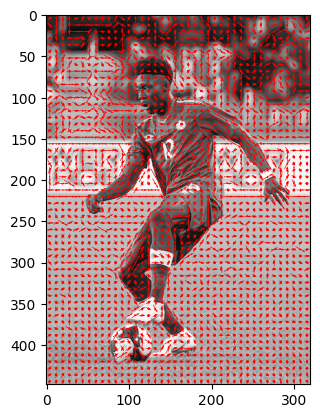

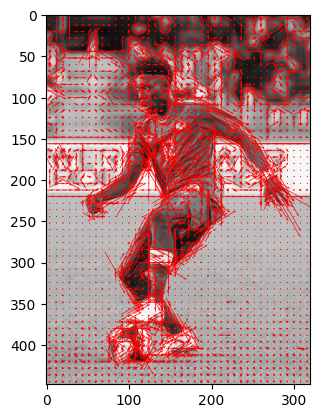

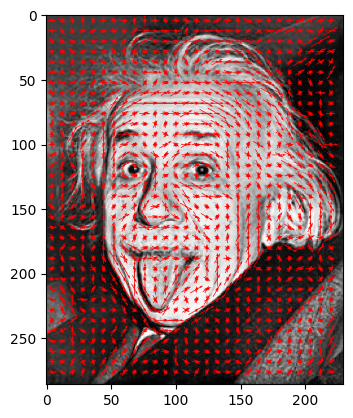

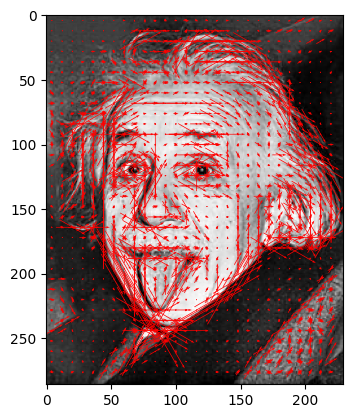

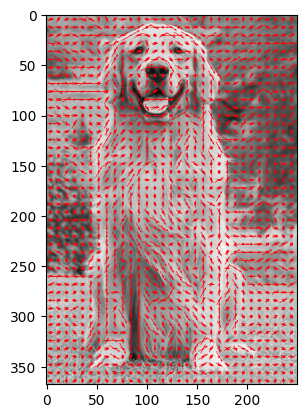

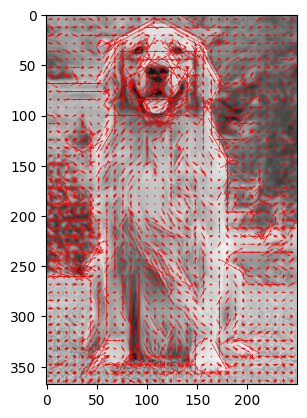

In [126]:
threshold = 8
tao = 8
directory = '/content/drive/My Drive/A3_images/Q3'

for img_path in os.listdir(directory):
    img = cv2.imread(os.path.join(directory, img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    magnitude_hist, occurence_hist = hog(img, threshold, tao)

    plot_hist(img, occurence_hist, tao)
    plot_hist(img, magnitude_hist, tao)

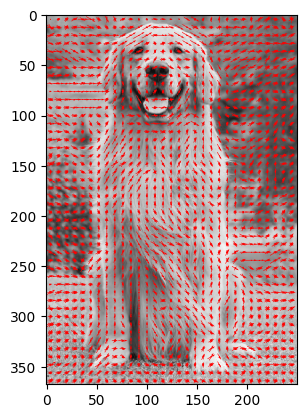

In [127]:
file_path = '/content/drive/My Drive'
transform_hist = adjust_norm_size(normalize(img, tao, magnitude_hist, file_path + '/3.txt'))
plot_hist(img, transform_hist, tao)

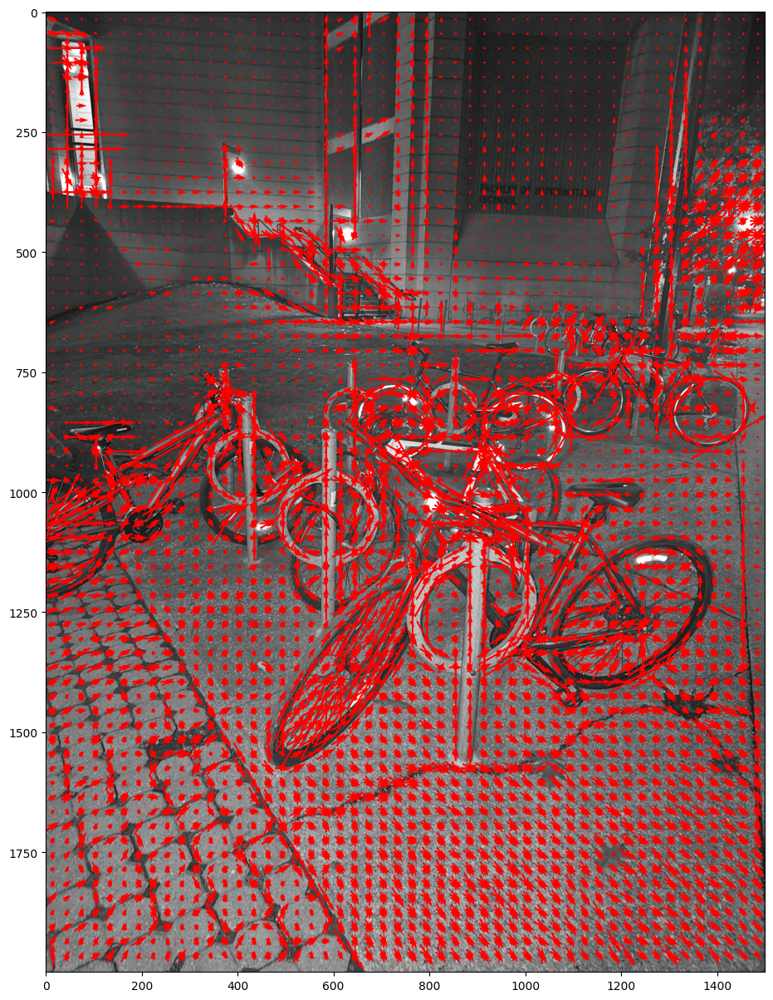

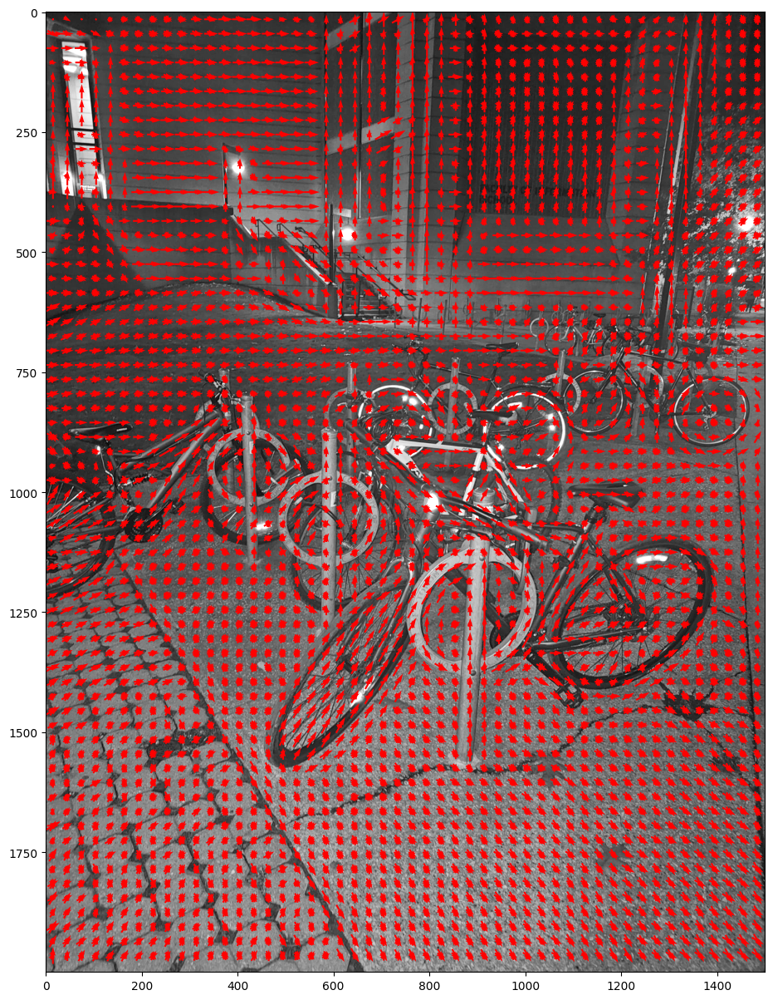

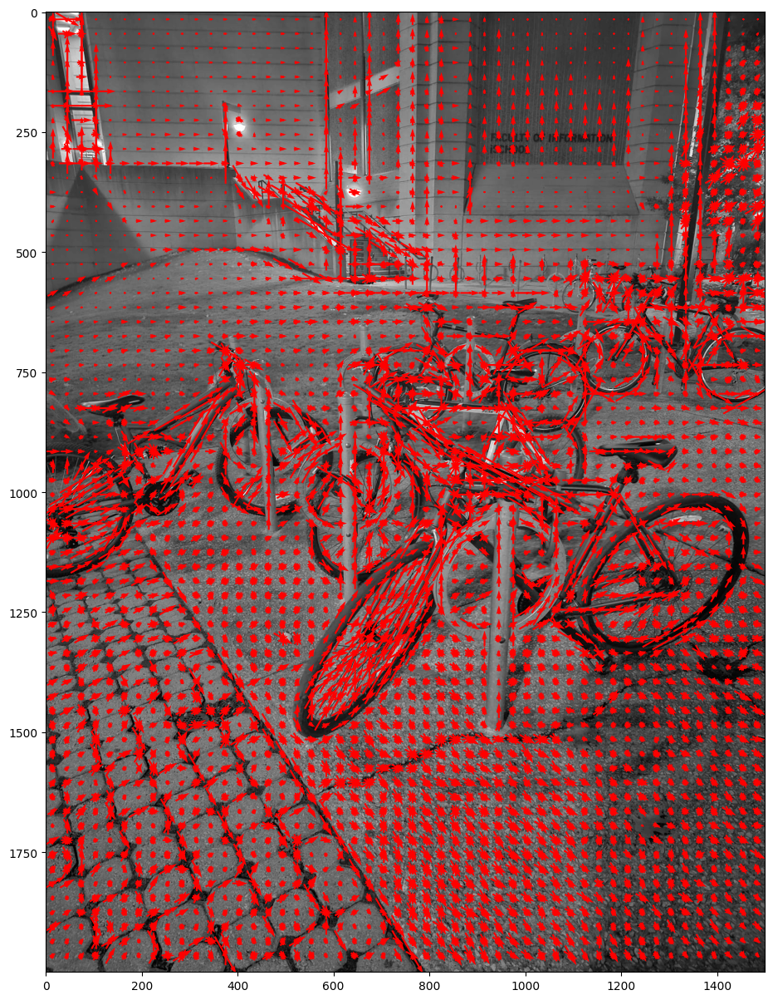

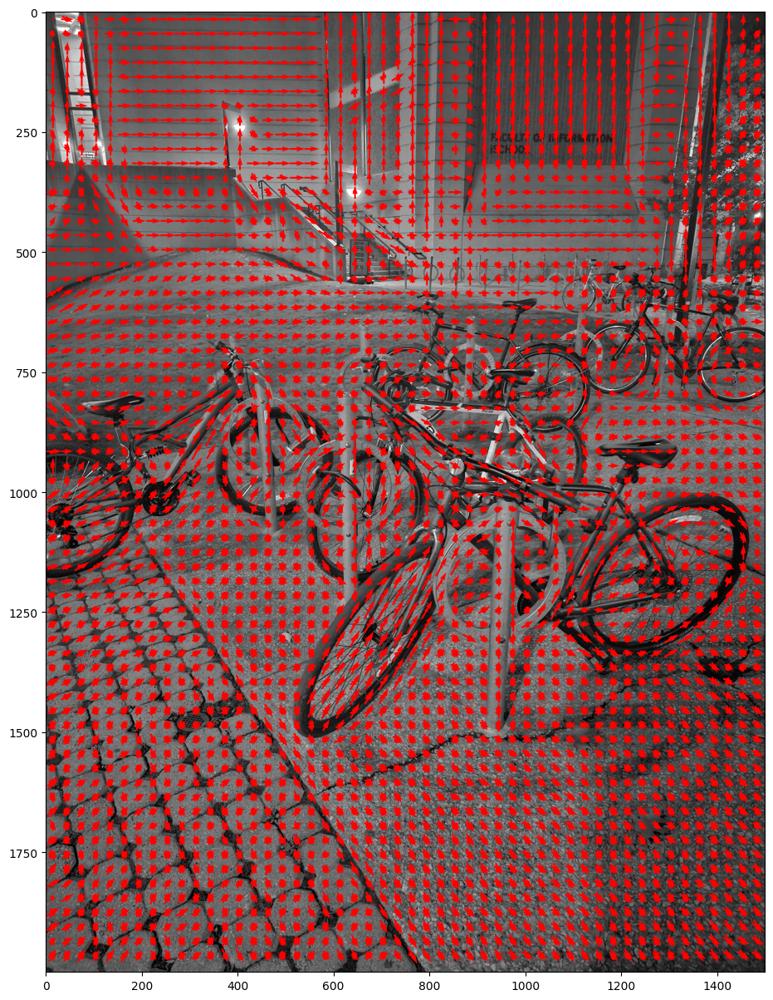

In [128]:
directory = '/content/drive/My Drive/'
tao = 30
for img_path in ['bike_flash', 'bike_normal']:
    img = cv2.imread(os.path.join(directory, img_path + '.jpg'))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    magnitude_hist, _ = hog(img, threshold, tao)
    plot_hist(img, magnitude_hist, tao)
    transform_hist = adjust_norm_size(normalize(img, tao, magnitude_hist, directory + img_path + '.txt'))
    plot_hist(img, transform_hist, tao)